In [1]:
# !pip install --ignore-installed --upgrade tensorflow
# !pip show tensorflow

In [2]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt

In [3]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS   = 3    # RGB
EPOCHS     = 30   # no. iterations to train the model

In [4]:
# Loading image dataset into tf.Dataset

dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "Disease_Train_Data",
    shuffle = True,
    image_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size = BATCH_SIZE 
)

Found 3747 files belonging to 8 classes.


In [5]:
class_names = dataset.class_names
class_names

['brownspot',
 'gudi_rotten',
 'healthy',
 'leaf_blast',
 'leaf_blight',
 'leaf_smut',
 'sheath_blight',
 'tungro']

In [6]:
#actual length is 118*32
len(dataset)   #length in batches

118

In [7]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[4 0 5 4 7 6 3 1 5 4 6 5 5 5 7 7 2 5 5 2 3 4 2 1 0 4 6 0 3 3 7 6]


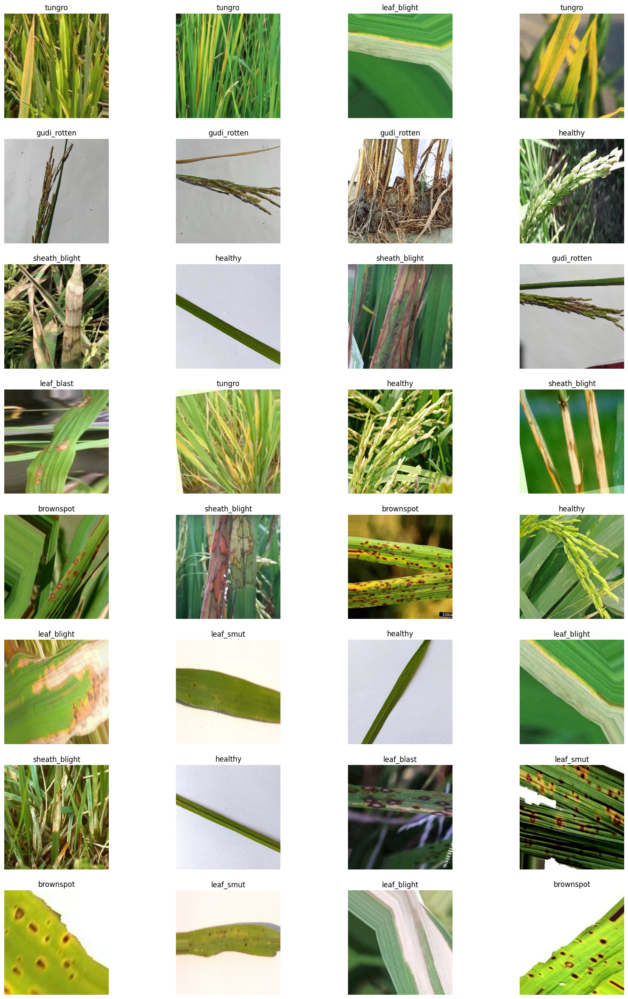

In [8]:
# Data Visualization

plt.figure(figsize=(20, 30))
for image_batch, label_batch in dataset.take(1):
    for i in range(BATCH_SIZE):
        ax = plt.subplot(BATCH_SIZE//4, 4, i + 1)   # row, col, idx
        plt.imshow(image_batch[i].numpy().astype("uint8"))   # converting float to int
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

In [9]:
#splitting dataset into train and test
# 80% ==> training
# 20% ==> 10% validation, 10% test
# after end of each epoch validation is done on the 10% and 
# other 10% is used after end of 50 epochs to measure the accuracy and test the performance of the model

In [10]:
# Hard coded 
train_size = 0.8  #80%
len(dataset)*train_size  # 80 % of 118 = 94.4

train_ds = dataset.take(94)   # first 94 batches arr[:94]
len(train_ds) # 94

test_ds = dataset.skip(94) # arr[94:]  94 onwards
len(test_ds) # 24

val_size = 0.1 #10%
len(dataset)*val_size  # 11.8

val_ds = test_ds.take(11)
len(val_ds) # 11

test_ds = test_ds.skip(11)
len(test_ds) # 13

13

In [11]:
#function for splitting test and train data

def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    ds_size = len(ds)
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [12]:
split_dataset = get_dataset_partitions_tf(dataset)

# print length of each set (in batch)

print("Total:", len(dataset))

for m, n in zip(("Train:", "Valid:", "Test: "), split_dataset):
    print(m, len(n))

Total: 118
Train: 94
Valid: 11
Test:  13


In [13]:
train_ds, val_ds, test_ds = (ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE) for ds in split_dataset)

In [14]:
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1./255),
])

In [15]:
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2),
])

In [16]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

model = models.Sequential([
    resize_and_rescale,
#     data_augmentation,
    
    # layering
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    # flatten
    layers.Flatten(),
    
    # dense layer
    layers.Dense(64, activation='relu'),
    layers.Dense(len(class_names), activation='softmax'),
])

model.build(input_shape=input_shape)

In [17]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (32, 127, 127, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (32, 60, 60, 64)         

In [18]:
sgd = tf.keras.optimizers.SGD(learning_rate = 1e-05)
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [19]:
#training
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=EPOCHS,
)

Epoch 1/30
94/94 [==============================] - 322s 2s/step - loss: 1.6241 - accuracy: 0.3646 - val_loss: 1.0819 - val_accuracy: 0.6335
Epoch 2/30
94/94 [==============================] - 143s 2s/step - loss: 0.9599 - accuracy: 0.6230 - val_loss: 0.6977 - val_accuracy: 0.7273
Epoch 3/30
94/94 [==============================] - 136s 1s/step - loss: 0.6315 - accuracy: 0.7600 - val_loss: 0.5492 - val_accuracy: 0.7585
Epoch 4/30
94/94 [==============================] - 126s 1s/step - loss: 0.5204 - accuracy: 0.8030 - val_loss: 0.4508 - val_accuracy: 0.8210
Epoch 5/30
94/94 [==============================] - 128s 1s/step - loss: 0.4062 - accuracy: 0.8456 - val_loss: 0.3848 - val_accuracy: 0.8438
Epoch 6/30
94/94 [==============================] - 130s 1s/step - loss: 0.4103 - accuracy: 0.8523 - val_loss: 0.2593 - val_accuracy: 0.9176
Epoch 7/30
94/94 [==============================] - 128s 1s/step - loss: 0.2924 - accuracy: 0.8973 - val_loss: 0.2267 - val_accuracy: 0.9148
Epoch 8/30
94

In [20]:
scores = model.evaluate(test_ds)

13/13 [==============================] - 65s 366ms/step - loss: 0.0350 - accuracy: 0.9952


In [21]:
model.metrics_names

['loss', 'accuracy']

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

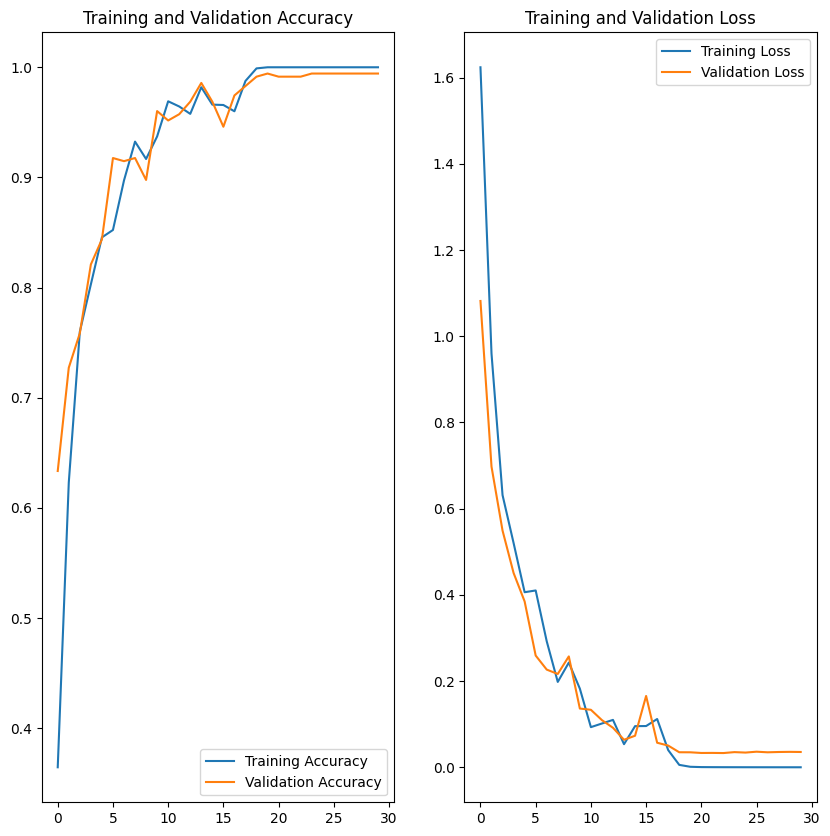

In [23]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 4s 4s/step


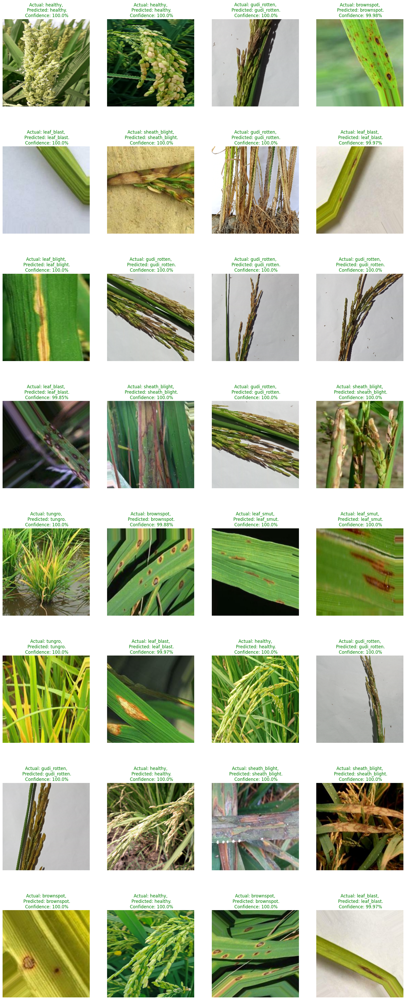

In [24]:
#testing
import numpy as np

plt.figure(figsize=(20, 50))
for image_batch, label_batch in test_ds.take(1):
    
    prediction_batch = model.predict(image_batch)   # contains array of size len(class_names) with confidence
    
    for i in range(BATCH_SIZE):
        
        image = image_batch[i].numpy().astype("uint8")   # converting float to int
        
        actual_class    = class_names[label_batch[i]]
        predicted_class = class_names[np.argmax(prediction_batch[i])]
        confidence      = round(100 * (np.max(prediction_batch[i])), 2)
        
        ax = plt.subplot(BATCH_SIZE//4, 4, i + 1)   # row, col, idx
        plt.imshow(image)
        title = plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.setp(title, color= 'g' if actual_class == predicted_class else 'r')
        plt.axis("off")
        
        

In [25]:
# to save the model
# model_version=1
# model.save(f"../models/{model_version}", save_format="h5")

In [26]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Our function needs a different name to sklearn's plot_confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False): 
  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with
  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels,
         )
  
  # Make x-axis labels appear on bottom
  ax.tick_params(axis='x', labelrotation=90)
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

In [27]:
predicted_classes = np.array([])
labels = np.array([])
for x, y in test_ds:
    predicted_classes = np.concatenate([predicted_classes, np.argmax(model(x), axis=-1)])
    labels = np.concatenate([labels, y.numpy()])

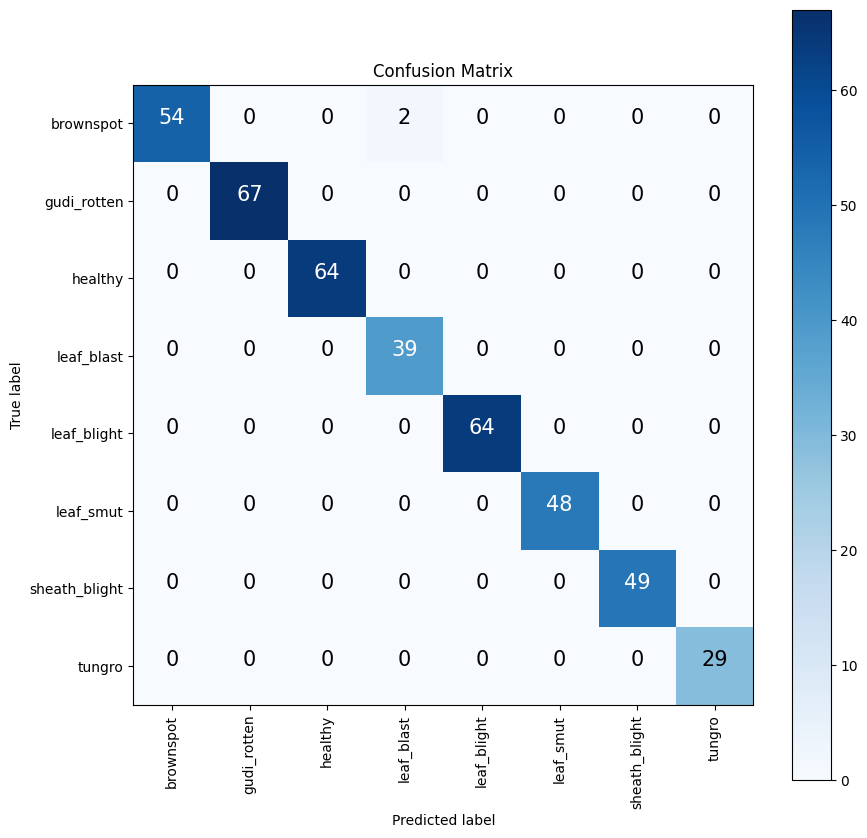

In [28]:
make_confusion_matrix(predicted_classes, labels, class_names)

In [29]:
 from sklearn.metrics import classification_report

print(classification_report(predicted_classes, labels, target_names=class_names))

               precision    recall  f1-score   support

    brownspot       1.00      0.96      0.98        56
  gudi_rotten       1.00      1.00      1.00        67
      healthy       1.00      1.00      1.00        64
   leaf_blast       0.95      1.00      0.97        39
  leaf_blight       1.00      1.00      1.00        64
    leaf_smut       1.00      1.00      1.00        48
sheath_blight       1.00      1.00      1.00        49
       tungro       1.00      1.00      1.00        29

     accuracy                           1.00       416
    macro avg       0.99      1.00      0.99       416
 weighted avg       1.00      1.00      1.00       416



In [30]:
# model.save(model_name, save_format="h5")
model.save("../models/rice_plant_disease_detection.h5")
print('Model Saved!')

Model Saved!
